In [ ]:
# import torch
# from torchvision import models, transforms
# from PIL import Image


# model = models.resnet152(pretrained=True)


# model.eval()


# transform = transforms.Compose([
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
# ])


# image = Image.open("image.jpg")
# image = transform(image)


# image = image.unsqueeze(0)


# if torch.cuda.is_available():
#     model = model.cuda()
#     image = image.cuda()


# with torch.no_grad():
#     output = model(image)


In [ ]:
# predicted_class = output.argmax(dim=1).item()
# print(predicted_class)

In [ ]:
# import pytesseract
# from PIL import Image


# def ocr_from_image(image_path):
#     image = Image.open(image_path)
#     text = pytesseract.image_to_string(image)
#     return text

# print(ocr_from_image("image.jpg"))


In [ ]:
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 71.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 32.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 122.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 80.3 MB/s eta 0:00:00


In [ ]:
import torch
from transformers import AutoTokenizer, AutoModel
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import re
import os
from nltk.corpus import stopwords
import nltk
from transformers import VisionEncoderDecoderModel, ViTImageProcessor, AutoTokenizer
import torch
from PIL import Image
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
feature_extractor = ViTImageProcessor.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
tokenizer = AutoTokenizer.from_pretrained("nlpconnect/vit-gpt2-image-captioning")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

max_length = 16
num_beams = 4
gen_kwargs = {"max_length": max_length, "num_beams": num_beams}



Some weights of the model checkpoint at nlpconnect/vit-gpt2-image-captioning were not used when initializing VisionEncoderDecoderModel: ['decoder.transformer.h.4.attn.bias', 'decoder.transformer.h.0.attn.bias', 'decoder.transformer.h.6.attn.bias', 'decoder.transformer.h.6.crossattention.bias', 'decoder.transformer.h.9.attn.bias', 'decoder.transformer.h.0.crossattention.bias', 'decoder.transformer.h.6.attn.masked_bias', 'decoder.transformer.h.3.attn.bias', 'decoder.transformer.h.2.attn.masked_bias', 'decoder.transformer.h.5.attn.masked_bias', 'decoder.transformer.h.0.attn.masked_bias', 'decoder.transformer.h.4.crossattention.bias', 'decoder.transformer.h.1.crossattention.bias', 'decoder.transformer.h.9.crossattention.masked_bias', 'decoder.transformer.h.10.attn.bias', 'decoder.transformer.h.8.attn.masked_bias', 'decoder.transformer.h.4.crossattention.masked_bias', 'decoder.transformer.h.8.crossattention.masked_bias', 'decoder.transformer.h.1.attn.bias', 'decoder.transformer.h.1.crossatt

In [ ]:
def predict_step(image_paths,model):
    images = []
    for image_path in image_paths:
        if os.path.isfile(image_path):
            i_image = Image.open(image_path)
            if i_image.mode != "RGB":
                i_image = i_image.convert(mode="RGB")
            images.append(i_image)
        else:
            return None

    if not images:
        return None

    pixel_values = feature_extractor(images=images, return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(device)

    output_ids = model.generate(pixel_values, **gen_kwargs)

    preds = tokenizer.batch_decode(output_ids, skip_special_tokens=True)
    preds = [pred.strip() for pred in preds]
    return preds

In [ ]:
num_params = sum(p.numel() for p in model.parameters())
print(f'The model has {num_params} parameters.')

The model has 239195904 parameters.


In [ ]:
!pip install torchviz graphviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4131 sha256=dedcbe1fbe5e816df71925ed0dbca21aaaf16d41c1d1d060ee09e9e929d811d6
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torchviz


In [ ]:
print(model)

VisionEncoderDecoderModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_featur

In [ ]:
import zipfile
with zipfile.ZipFile('kaggle.zip', 'r') as zip_ref:
    zip_ref.extractall()

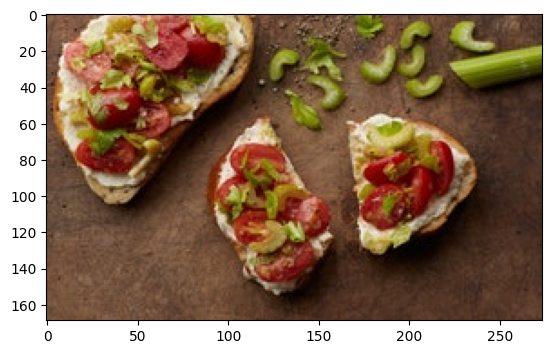

['two slices of pizza sitting on top of a wooden cutting board']

In [ ]:
img = cv2.imread('Food Images/Food Images/-bloody-mary-tomato-toast-with-celery-and-horseradish-56389813.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()
predict_step(['Food Images/Food Images/-bloody-mary-tomato-toast-with-celery-and-horseradish-56389813.jpg'],model)

In [ ]:
data = pd.read_csv('Food Ingredients and Recipe Dataset with Image Name Mapping.csv', index_col=0)
data = data[data['Image_Name'] != '#NAME?']
data = data.reset_index(drop=True)
data.head()

,Title,Ingredients,Instructions,Image_Name,Cleaned_Ingredients
0,Miso-Butter Roast Chicken With Acorn Squash Pa...,"['1 (3½–4-lb.) whole chicken', '2¾ tsp. kosher...","Pat chicken dry with paper towels, season all ...",miso-butter-roast-chicken-acorn-squash-panzanella,"['1 (3½–4-lb.) whole chicken', '2¾ tsp. kosher..."
1,Crispy Salt and Pepper Potatoes,"['2 large egg whites', '1 pound new potatoes (...",Preheat oven to 400°F and line a rimmed baking...,crispy-salt-and-pepper-potatoes-dan-kluger,"['2 large egg whites', '1 pound new potatoes (..."
2,Thanksgiving Mac and Cheese,"['1 cup evaporated milk', '1 cup whole milk', ...",Place a rack in middle of oven; preheat to 400...,thanksgiving-mac-and-cheese-erick-williams,"['1 cup evaporated milk', '1 cup whole milk', ..."
3,Italian Sausage and Bread Stuffing,"['1 (¾- to 1-pound) round Italian loaf, cut in...",Preheat oven to 350°F with rack in middle. Gen...,italian-sausage-and-bread-stuffing-240559,"['1 (¾- to 1-pound) round Italian loaf, cut in..."
4,Newton's Law,"['1 teaspoon dark brown sugar', '1 teaspoon ho...",Stir together brown sugar and hot water in a c...,newtons-law-apple-bourbon-cocktail,"['1 teaspoon dark brown sugar', '1 teaspoon ho..."


In [ ]:
def extract_ingredients(data):
    ingredients = []
    for i in range(len(data)):
        ingredients.extend(data['Image_Name'][i].split('-'))
    return ingredients

In [ ]:
ingredients = extract_ingredients(data)
ingredients = list(set(ingredients))

stop_words = set(stopwords.words('english'))


def is_allowed(word):
    return word not in stop_words and not re.match(r'\d+', word)


# Filter words
filtered_ingredients = [word for word in ingredients if is_allowed(word)]

len(filtered_ingredients)

5007

In [ ]:
data['Image_Path'] = 'Food Images/Food Images/'+ data['Image_Name'] + '.jpg'

In [ ]:
data.head()

,Title,Ingredients,Instructions,Image_Name,Cleaned_Ingredients,Image_Path
0,Miso-Butter Roast Chicken With Acorn Squash Pa...,"['1 (3½–4-lb.) whole chicken', '2¾ tsp. kosher...","Pat chicken dry with paper towels, season all ...",miso-butter-roast-chicken-acorn-squash-panzanella,"['1 (3½–4-lb.) whole chicken', '2¾ tsp. kosher...",Food Images/Food Images/miso-butter-roast-chic...
1,Crispy Salt and Pepper Potatoes,"['2 large egg whites', '1 pound new potatoes (...",Preheat oven to 400°F and line a rimmed baking...,crispy-salt-and-pepper-potatoes-dan-kluger,"['2 large egg whites', '1 pound new potatoes (...",Food Images/Food Images/crispy-salt-and-pepper...
2,Thanksgiving Mac and Cheese,"['1 cup evaporated milk', '1 cup whole milk', ...",Place a rack in middle of oven; preheat to 400...,thanksgiving-mac-and-cheese-erick-williams,"['1 cup evaporated milk', '1 cup whole milk', ...",Food Images/Food Images/thanksgiving-mac-and-c...
3,Italian Sausage and Bread Stuffing,"['1 (¾- to 1-pound) round Italian loaf, cut in...",Preheat oven to 350°F with rack in middle. Gen...,italian-sausage-and-bread-stuffing-240559,"['1 (¾- to 1-pound) round Italian loaf, cut in...",Food Images/Food Images/italian-sausage-and-br...
4,Newton's Law,"['1 teaspoon dark brown sugar', '1 teaspoon ho...",Stir together brown sugar and hot water in a c...,newtons-law-apple-bourbon-cocktail,"['1 teaspoon dark brown sugar', '1 teaspoon ho...",Food Images/Food Images/newtons-law-apple-bour...


In [ ]:
data['Caption'] = data['Image_Path'].apply(lambda x: predict_step([x]) if predict_step([x]) is not None else None)

In [ ]:
data.head()

,Title,Ingredients,Instructions,Image_Name,Cleaned_Ingredients,Image_Path,Caption
0,Miso-Butter Roast Chicken With Acorn Squash Pa...,"['1 (3½–4-lb.) whole chicken', '2¾ tsp. kosher...","Pat chicken dry with paper towels, season all ...",miso-butter-roast-chicken-acorn-squash-panzanella,"['1 (3½–4-lb.) whole chicken', '2¾ tsp. kosher...",Food Images/Food Images/miso-butter-roast-chic...,[a plate of food on a table]
1,Crispy Salt and Pepper Potatoes,"['2 large egg whites', '1 pound new potatoes (...",Preheat oven to 400°F and line a rimmed baking...,crispy-salt-and-pepper-potatoes-dan-kluger,"['2 large egg whites', '1 pound new potatoes (...",Food Images/Food Images/crispy-salt-and-pepper...,[a bowl filled with lots of different types of...
2,Thanksgiving Mac and Cheese,"['1 cup evaporated milk', '1 cup whole milk', ...",Place a rack in middle of oven; preheat to 400...,thanksgiving-mac-and-cheese-erick-williams,"['1 cup evaporated milk', '1 cup whole milk', ...",Food Images/Food Images/thanksgiving-mac-and-c...,[a pan filled with food on top of a table]
3,Italian Sausage and Bread Stuffing,"['1 (¾- to 1-pound) round Italian loaf, cut in...",Preheat oven to 350°F with rack in middle. Gen...,italian-sausage-and-bread-stuffing-240559,"['1 (¾- to 1-pound) round Italian loaf, cut in...",Food Images/Food Images/italian-sausage-and-br...,[a slice of pizza sitting on top of a white pl...
4,Newton's Law,"['1 teaspoon dark brown sugar', '1 teaspoon ho...",Stir together brown sugar and hot water in a c...,newtons-law-apple-bourbon-cocktail,"['1 teaspoon dark brown sugar', '1 teaspoon ho...",Food Images/Food Images/newtons-law-apple-bour...,[a glass of orange juice sitting on top of a t...


**Fine Tuning the Pre trained model on this dataset**

In [ ]:
df = pd.read_csv('Food Ingredients and Recipe Dataset with Image Name Mapping.csv',index_col = 0)
df = df[df['Image_Name'] != '#NAME?']
df = df.reset_index(drop=True)
df['Image_Path'] = 'Food Images/Food Images/'+ df['Image_Name'] + '.jpg'




device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

batch_size = 8
epochs = 10
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
print_every = 10

for epoch in range(epochs):
    for i in range(0, df.shape[0], batch_size):
        batch = df.iloc[i:i+batch_size]
        images = []
        captions = []
        for _, row in batch.iterrows():
            img = Image.open(row['Image_Path'])
            if img.mode != "RGB":
                img = img.convert("RGB")
            images.append(img)
            captions.append(row['Image_Name'])

        inputs = feature_extractor(images=images, return_tensors="pt")
        inputs = {k: v.to(device) for k, v in inputs.items()}
        with tokenizer.as_target_tokenizer():
            labels = tokenizer(captions, return_tensors="pt", padding="max_length", truncation=True, max_length=16)

        labels = labels.input_ids.to(device)

        outputs = model(**inputs, labels=labels)

        loss = outputs.loss
        loss.backward()

        optimizer.step()
        optimizer.zero_grad()

        if i % (print_every * batch_size) == 0:
            print(f'Epoch: {epoch}, Iteration: {i}, Loss: {loss.item()}')


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:3619: UserWarning: `as_target_tokenizer` is deprecated and will be removed in v5 of Transformers. You can tokenize your labels by using the argument `text_target` of the regular `__call__` method (either in the same call as your input texts if you use the same keyword arguments, or in a separate call.
  warnings.warn(


Epoch: 0, Iteration: 0, Loss: 6.06749153137207
Epoch: 0, Iteration: 80, Loss: 3.717081069946289
Epoch: 0, Iteration: 160, Loss: 2.480222225189209
Epoch: 0, Iteration: 240, Loss: 2.6176440715789795
Epoch: 0, Iteration: 320, Loss: 2.6799001693725586
Epoch: 0, Iteration: 400, Loss: 2.3213839530944824
Epoch: 0, Iteration: 480, Loss: 1.9423840045928955
Epoch: 0, Iteration: 560, Loss: 1.6588340997695923
Epoch: 0, Iteration: 640, Loss: 2.3239922523498535
Epoch: 0, Iteration: 720, Loss: 2.0485801696777344
Epoch: 0, Iteration: 800, Loss: 2.049558401107788
Epoch: 0, Iteration: 880, Loss: 2.440140962600708
Epoch: 0, Iteration: 960, Loss: 1.795859456062317
Epoch: 0, Iteration: 1040, Loss: 2.4809272289276123
Epoch: 0, Iteration: 1120, Loss: 2.2970268726348877
Epoch: 0, Iteration: 1200, Loss: 2.502117872238159
Epoch: 0, Iteration: 1280, Loss: 1.5347381830215454
Epoch: 0, Iteration: 1360, Loss: 1.814828872680664
Epoch: 0, Iteration: 1440, Loss: 2.392263650894165
Epoch: 0, Iteration: 1520, Loss: 2.499

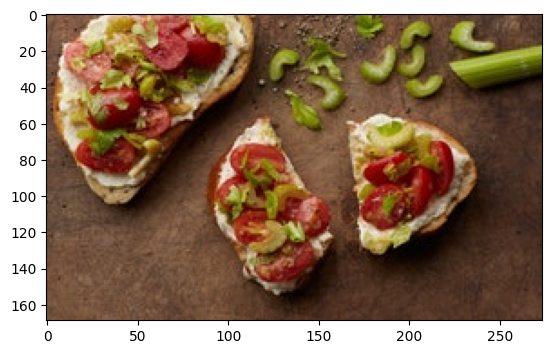

['open-face-mushroom-and-fontina-sandwic']

In [ ]:
img = cv2.imread('Food Images/Food Images/-bloody-mary-tomato-toast-with-celery-and-horseradish-56389813.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()
predict_step(['Food Images/Food Images/-bloody-mary-tomato-toast-with-celery-and-horseradish-56389813.jpg'])

In [ ]:
model_before_finetuning  = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_before_finetuning.to(device)
model_after_finetuning = model

Some weights of the model checkpoint at nlpconnect/vit-gpt2-image-captioning were not used when initializing VisionEncoderDecoderModel: ['decoder.transformer.h.4.attn.bias', 'decoder.transformer.h.0.attn.bias', 'decoder.transformer.h.6.attn.bias', 'decoder.transformer.h.6.crossattention.bias', 'decoder.transformer.h.9.attn.bias', 'decoder.transformer.h.0.crossattention.bias', 'decoder.transformer.h.6.attn.masked_bias', 'decoder.transformer.h.3.attn.bias', 'decoder.transformer.h.2.attn.masked_bias', 'decoder.transformer.h.5.attn.masked_bias', 'decoder.transformer.h.0.attn.masked_bias', 'decoder.transformer.h.4.crossattention.bias', 'decoder.transformer.h.1.crossattention.bias', 'decoder.transformer.h.9.crossattention.masked_bias', 'decoder.transformer.h.10.attn.bias', 'decoder.transformer.h.8.attn.masked_bias', 'decoder.transformer.h.4.crossattention.masked_bias', 'decoder.transformer.h.8.crossattention.masked_bias', 'decoder.transformer.h.1.attn.bias', 'decoder.transformer.h.1.crossatt

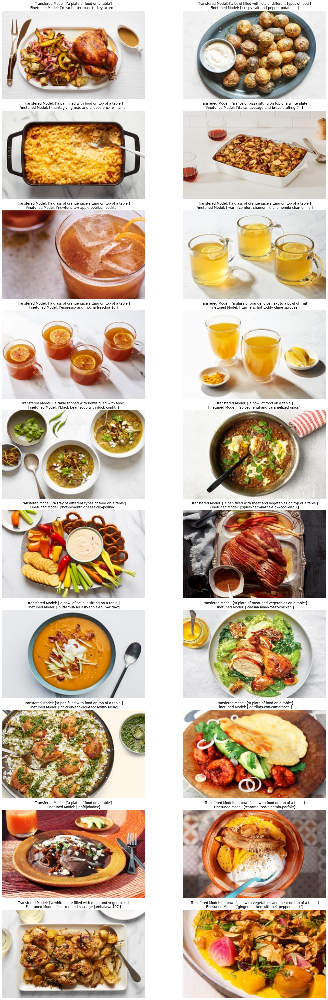

In [ ]:
df_sample = df.head(20)

# Calculate number of rows needed for 2 columns
num_rows = len(df_sample) // 2 if len(df_sample) % 2 == 0 else len(df_sample) // 2 + 1

# Create subplots with 2 columns
fig, axs = plt.subplots(num_rows, 2, figsize=(20, num_rows*5))  # Adjust the figsize as needed

for i, row in df_sample.iterrows():
    img = cv2.imread(row['Image_Path'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    caption_transfered = predict_step([row['Image_Path']], model_before_finetuning)
    caption_finetuned = predict_step([row['Image_Path']], model_after_finetuning)

    # Calculate subplot coordinates
    row_i = i // 2
    col_i = i % 2

    axs[row_i][col_i].imshow(img)
    axs[row_i][col_i].set_title(f"Transfered Model: {caption_transfered}\nFinetuned Model: {caption_finetuned}")
    axs[row_i][col_i].axis('off')

# If there is an odd number of images, remove the last (empty) subplot
if len(df_sample) % 2 != 0:
    fig.delaxes(axs[row_i][1])

plt.tight_layout()
plt.savefig('output.png', dpi=300)
plt.show()


In [45]:
model.save_pretrained('finetuned_model')
model.save_pretrained('/content/drive/MyDrive/Colab Notebooks/finetuned_model')


In [46]:
#checking

from transformers import VisionEncoderDecoderModel
model_new = VisionEncoderDecoderModel.from_pretrained('/content/drive/MyDrive/Colab Notebooks/finetuned_model')


In [47]:
model_new

VisionEncoderDecoderModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_featur

In [44]:
#save the dataset too
data.to_csv("New_Food_Ingredients_Recipe_Dataset_with_Image_Name_Mapping.csv")

In [43]:
#checking

new_data = pd.read_csv("New_Food_Ingredients_Recipe_Dataset_with_Image_Name_Mapping.csv")
new_data.head()

,Unnamed: 0,Title,Ingredients,Instructions,Image_Name,Cleaned_Ingredients,Image_Path,Caption
0,0,Miso-Butter Roast Chicken With Acorn Squash Pa...,"['1 (3½–4-lb.) whole chicken', '2¾ tsp. kosher...","Pat chicken dry with paper towels, season all ...",miso-butter-roast-chicken-acorn-squash-panzanella,"['1 (3½–4-lb.) whole chicken', '2¾ tsp. kosher...",Food Images/Food Images/miso-butter-roast-chic...,['a plate of food on a table']
1,1,Crispy Salt and Pepper Potatoes,"['2 large egg whites', '1 pound new potatoes (...",Preheat oven to 400°F and line a rimmed baking...,crispy-salt-and-pepper-potatoes-dan-kluger,"['2 large egg whites', '1 pound new potatoes (...",Food Images/Food Images/crispy-salt-and-pepper...,['a bowl filled with lots of different types o...
2,2,Thanksgiving Mac and Cheese,"['1 cup evaporated milk', '1 cup whole milk', ...",Place a rack in middle of oven; preheat to 400...,thanksgiving-mac-and-cheese-erick-williams,"['1 cup evaporated milk', '1 cup whole milk', ...",Food Images/Food Images/thanksgiving-mac-and-c...,['a pan filled with food on top of a table']
3,3,Italian Sausage and Bread Stuffing,"['1 (¾- to 1-pound) round Italian loaf, cut in...",Preheat oven to 350°F with rack in middle. Gen...,italian-sausage-and-bread-stuffing-240559,"['1 (¾- to 1-pound) round Italian loaf, cut in...",Food Images/Food Images/italian-sausage-and-br...,['a slice of pizza sitting on top of a white p...
4,4,Newton's Law,"['1 teaspoon dark brown sugar', '1 teaspoon ho...",Stir together brown sugar and hot water in a c...,newtons-law-apple-bourbon-cocktail,"['1 teaspoon dark brown sugar', '1 teaspoon ho...",Food Images/Food Images/newtons-law-apple-bour...,['a glass of orange juice sitting on top of a ...
